# 합성곱 신경망(Convolutional Neural Networks, CNNs)

- 이미지 인식, 음성 인식 등에 자주 사용되는데,  
  특히, 이미지 인식 분야에서 거의 모든 딥러닝 기술에 사용

<br>

## 컨볼루션 신경망의 등장
- 1989년 얀 르쿤(Yann LeCun) 교수의 논문에서 발표

  - 필기체 인식에서 의미가 있었지만 범용화하는데에는 무리

- 1998년, "Gradient-Based Learning Applied to Document Recognition"이라는 논문에서 LeNet-5 제시

- 합성곱 층(convolution layer), 풀링 층(pooling layer) 소개
  <br>

  <img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>


## 완전연결계층과의 차이
- 완전연결계층(Fully-Connected Layer)은 이미지와 같은 공간, 위치 데이터의 형상(3차원)을 잃어버리거나, 무시함  

- 모든 입력데이터를 동등하게 취급  
  즉, **데이터의 특징을 잃어버리게 됨**

- 컨볼루션층(convolution layer)은 <u>**이미지 픽셀 사이의 관계를 고려**</u>

- 완전연결계층은 공간정보를 손실하지만, 컨볼루션층은 공간정보를 유지  
  - 이미지와 같은 2차원(흑백) 또는 3차원(컬러)의 형상을 유지

  - 공간정보를 유지하기 때문에 완전연결계층에 비해 적은 수의 파라미터를 요구


## 컨볼루션 신경망 구조 예시

<img src="https://www.scielo.org.mx/img/revistas/rmib/v42n2//2395-9126-rmib-42-02-1176-gf1.gif" width="600">

<sub>출처: https://www.scielo.org.mx/img/revistas/rmib/v42n2//2395-9126-rmib-42-02-1176-gf1.gif</sub>



## 합성곱 연산
- 필터(filter) 연산
  - 입력 데이터에 필터를 통한 어떠한 연산을 진행
  
  - **필터에 대응하는 원소끼리 곱하고, 그 합을 구함**

  - 연산이 완료된 결과 데이터를 **특징 맵(feature map)**이라 부름

- 필터(filter)
  - 커널(kernel)이라고도 칭함
  
  - 흔히 사진 어플에서 사용하는 '이미지 필터'와 비슷한 개념

  - 필터의 사이즈는 "거의 항상 홀수"
    - 짝수이면 패딩이 비대칭이 되어버림
  
    - 왼쪽, 오른쪽을 다르게 주어야함
  
    - 중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재

  - 필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정  
    따라서, 과적합을 방지할 수 있음

  <br>
  <img src="https://miro.medium.com/max/535/1*Zx-ZMLKab7VOCQTxdZ1OAw.gif">

  <sub>출처: http://deeplearning.net/software/theano_versions/dev/tutorial/conv_arithmetic.html</sub>


- 연산 시각화
  <img src="https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png" width="500">

  <sub>출처: https://www.researchgate.net/figure/An-example-of-convolution-operation-in-2D-2_fig3_324165524</sub>


- 일반적으로, 합성곱 연산을 한 후의 데이터 사이즈는  
  ### $\quad (n-f+1) \times (n-f+1)$
    $n$: 입력 데이터의 크기  
    $f$: 필터(커널)의 크기


  <img src="https://miro.medium.com/max/1400/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="400">

  <img src="https://developers.google.com/machine-learning/practica/image-classification/images/maxpool_animation.gif" width="400">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>

  <sub>출처: https://developers.google.com/</sub>
  
  위 예에서 입력 데이터 크기($n$)는 5, 필터의 크기($k$)는 3이므로  
  출력 데이터의 크기는 $(5 - 3 + 1) = 3$


## 패딩(padding)과 스트라이드(stride)
- 필터(커널) 사이즈과 함께 **입력 이미지와 출력 이미지의 사이즈를 결정**하기 위해 사용

- 사용자가 결정할 수 있음



### 패딩
- 입력 데이터의 주변을 특정 값으로 채우는 기법
  - 주로 0으로 많이 채움

  <img src="https://docs.huihoo.com/theano/0.9/_images/arbitrary_padding_no_strides.gif" width="300">
  <img src="https://docs.huihoo.com/theano/0.9/_images/numerical_padding_strides.gif" width="300">
<sub>출처:https://docs.huihoo.com</sub>
- 출력 데이터의 크기
  ### $\quad (n+2p-f+1) \times (n+2p-f+1)$

  위 그림에서, 입력 데이터의 크기($n$)는 5, 필터의 크기($f$)는 4, 패딩값($p$)은 2이므로    
  출력 데이터의 크기는 ($5 + 2\times 2 - 4 + 1) = 6$

### 'valid' 와 'same'
- 'valid'
  - 패딩을 주지 않음
  - padding=0 (0으로 채워진 테두리가 아니라 패딩을 주지 않는다는 의미)

- 'same'
  - 패딩을 주어 입력 이미지의 크기와 연산 후의 이미지 크기를 같게함

  - 만약, 필터(커널)의 크기가 $k$ 이면,  
    패딩의 크기는 $p = \frac{k-1}{2}$ (단, <u>stride=1)</u>



### 스트라이드
- 필터를 적용하는 간격을 의미

- 아래는 그림의 간격 2

  <img src="https://docs.huihoo.com/theano/0.9/_images/no_padding_strides.gif">


## 출력 데이터의 크기

## $\qquad OH = \frac{H + 2P - FH}{S} + 1 $
## $\qquad OW = \frac{W + 2P - FW}{S} + 1 $

- 입력 크기 : $(H, W)$

- 필터 크기 : $(FH, FW)$

- 출력 크기 : $(OH, OW)$

- 패딩, 스트라이드 : $P, S$

- (주의)
  - 위 식의 값에서 $\frac{H + 2P - FH}{S}$ 또는 $\frac{W + 2P - FW}{S}$가 정수로 나누어 떨어지는 값이어야 함
  - 만약, 정수로 나누어 떨어지지 않으면  
    패딩, 스트라이드값을 조정하여 정수로 나누어 떨어지게 해야함


## 풀링(Pooling)

- 필터(커널) 사이즈 내에서 특정 값을 추출하는 과정

### 맥스 풀링(Max Pooling)
- 가장 많이 사용되는 방법

- 출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일
## $\quad OH = \frac{H + 2P - FH}{S} + 1 $
## $\quad OW = \frac{W + 2P - FW}{S} + 1 $

- 일반적으로 stride=2, kernel_size=2 를 통해  
  **특징맵의 크기를 <u>절반으로 줄이는 역할</u>**

- 모델이 물체의 주요한 특징을 학습할 수 있도록 해주며,  
  컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌
  - 예를 들어, 아래의 그림에서 초록색 사각형 안에 있는  
    2와 8의 위치를 바꾼다해도 맥스 풀링 연산은 8을 추출

- 모델의 파라미터 개수를 줄여주고, 연산 속도를 빠르게 해줌

  <br>

  <img src="https://cs231n.github.io/assets/cnn/maxpool.jpeg" width="600">

  <sub>출처: https://cs231n.github.io/convolutional-networks/</sub>

### 평균 풀링(Avg Pooling)

- 필터 내의 있는 픽셀값의 평균을 구하는 과정

- 과거에 많이 사용, 요즘은 잘 사용되지 않는다.

- 맥스풀링과 마찬가지로 stride=2, kernel_size=2 를 통해  
  특징 맵의 사이즈를 줄이는 역할

  <img src="https://www.researchgate.net/profile/Juan-Pedro-Dominguez-Morales/publication/329885401/figure/fig21/AS:707709083062277@1545742402308/Average-pooling-example.png" width="600">

  <sub>출처: https://www.researchgate.net/figure/Average-pooling-example_fig21_329885401</sub>

## 합성곱 연산의 의미

## 2차원 이미지에 대한 필터 연산 예시
  - 가장 자리 검출(Edge-Detection)

  - 소벨 필터(Sobel Filter)

    - Horizontal : 가로 방향의 미분을 구하는 필터 역할

    - Vertical : 세로 방향의 미분을 구하는 필터 역할  

  <img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT_ZRkuiCkv0ZEHFiyCp-7Y5bCL0liaYSQ4mg&usqp=CAU" width="350">

  <sub>출처: https://www.cloras.com/blog/image-recognition/</sub>


### modules import

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib
import requests
from io import BytesIO


### util functions

In [ ]:
def url_to_image(url, gray=False):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")

  if gray == True:
    image = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)
  else:
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  return image

def filtered_image(image, filter, output_size):
  filtered_img = np.zeros((output_size, output_size))
  filter_size = filter.shape[0]

  for i in range(output_size):
    for j in range(output_size):

      multiply_values = image[i:(i + filter_size), j:(j + filter_size)] * filter
      sum_value = np.sum(multiply_values)

      if (sum_value > 255):
        sum_value = 255

      filtered_img[i, j] = sum_value

  return filtered_img

### 이미지 확인
- 예시이므로 정사각형 사이즈로 진행

image.shape: (440, 440)


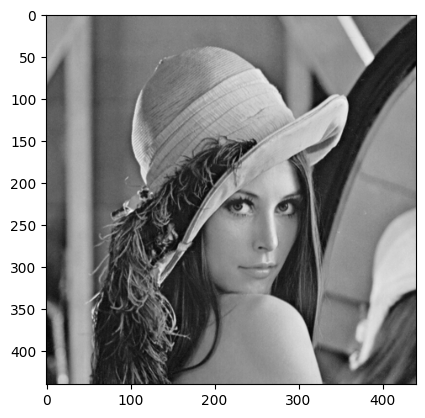

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

image = url_to_image(img_url, gray=True)
print("image.shape:", image.shape)

plt.imshow(image, cmap='gray')
plt.show()

### 필터연산 적용

output size: 438


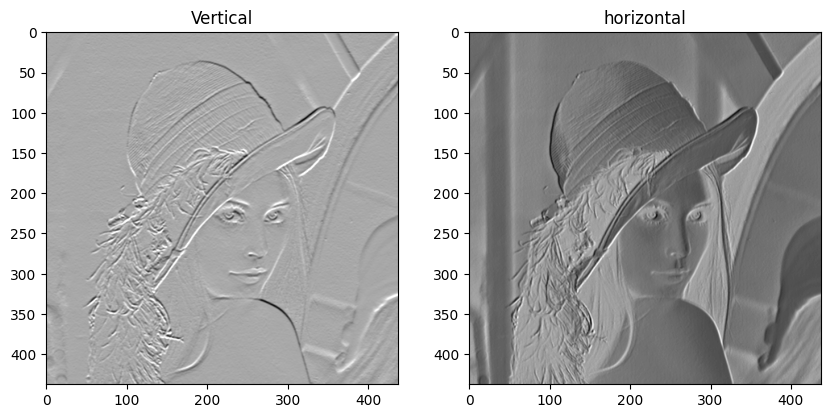

In [ ]:
vertical_filter = np.array([[1., 2., 1.],
                            [0., 0., 0.],
                            [-1., -2., -1.]])

horizontal_filter = np.array([[1., 0., -1.],
                              [2., 0., -2.],
                              [-1., 0., -1.]])

output_size = int((image.shape[0] -3 / 1 + 1))
print("output size:", output_size)

vertical_filtered = filtered_image(image, vertical_filter, output_size)
horizontal_filtered = filtered_image(image, horizontal_filter, output_size)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("Vertical")
plt.imshow(vertical_filtered, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("horizontal")
plt.imshow(horizontal_filtered, cmap='gray')
plt.show()

### 이미지 필터를 적용한 최종 결과

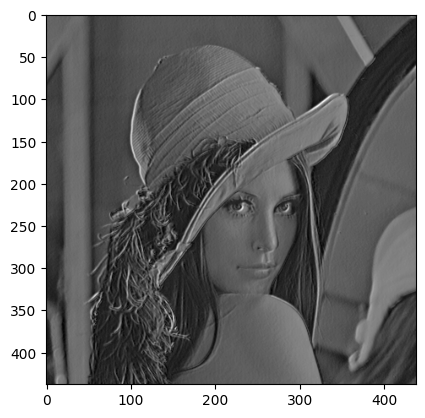

In [ ]:
sobel_img = np.sqrt(np.square(horizontal_filtered) + np.square(vertical_filtered))

plt.imshow(sobel_img, cmap='gray')

## 3차원 데이터의 합성곱 연산
- **이미지는 3차원으로 구성**
  - (가로, 세로, 채널 수)
  - 채널 : RGB

- 색상값의 정도에 따라 color색 결정

  <img src="https://www.projectorcentral.com/images/articles/RGB-Explained-600.jpg">

  <sub>출처: https://www.projectorcentral.com/All-About-Bit-Depth.htm?page=What-Bit-Depth-Looks-Like</sub>

### 아래의 이미지 확인은 참고사항

image.shape: (440, 440, 3)


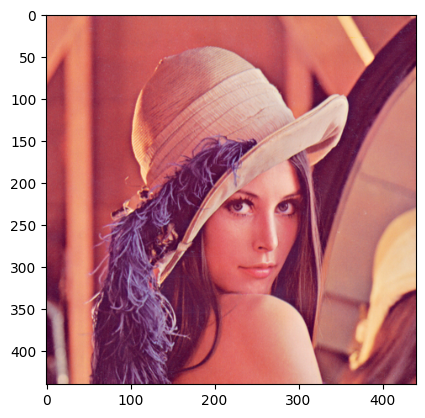

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

image = url_to_image(img_url)
print("image.shape:", image.shape)

plt.imshow(image)
plt.show()

In [ ]:
# 이미지가 rgb가 있는데 그린과 블루는 다 0으로 변환하고 red만 남긴것
image_copy = image.copy()
image_copy[:, :, 1] = 0
image_copy[:, :, 2] = 0
image_red = image_copy

In [ ]:
print(image_red)

[[[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [233   0   0]
  [224   0   0]
  [202   0   0]]

 [[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [233   0   0]
  [224   0   0]
  [202   0   0]]

 [[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [232   0   0]
  [223   0   0]
  [201   0   0]]

 ...

 [[ 84   0   0]
  [ 86   0   0]
  [ 93   0   0]
  ...
  [174   0   0]
  [169   0   0]
  [172   0   0]]

 [[ 82   0   0]
  [ 86   0   0]
  [ 95   0   0]
  ...
  [177   0   0]
  [178   0   0]
  [183   0   0]]

 [[ 81   0   0]
  [ 86   0   0]
  [ 96   0   0]
  ...
  [178   0   0]
  [181   0   0]
  [185   0   0]]]


In [ ]:
image_copy = image.copy()
image_copy[:, :, 0] = 0
image_copy[:, :, 2] = 0
image_green = image_copy

In [ ]:
image_copy = image.copy()
image_copy[:, :, 0] = 0
image_copy[:, :, 1] = 0
image_blue = image_copy

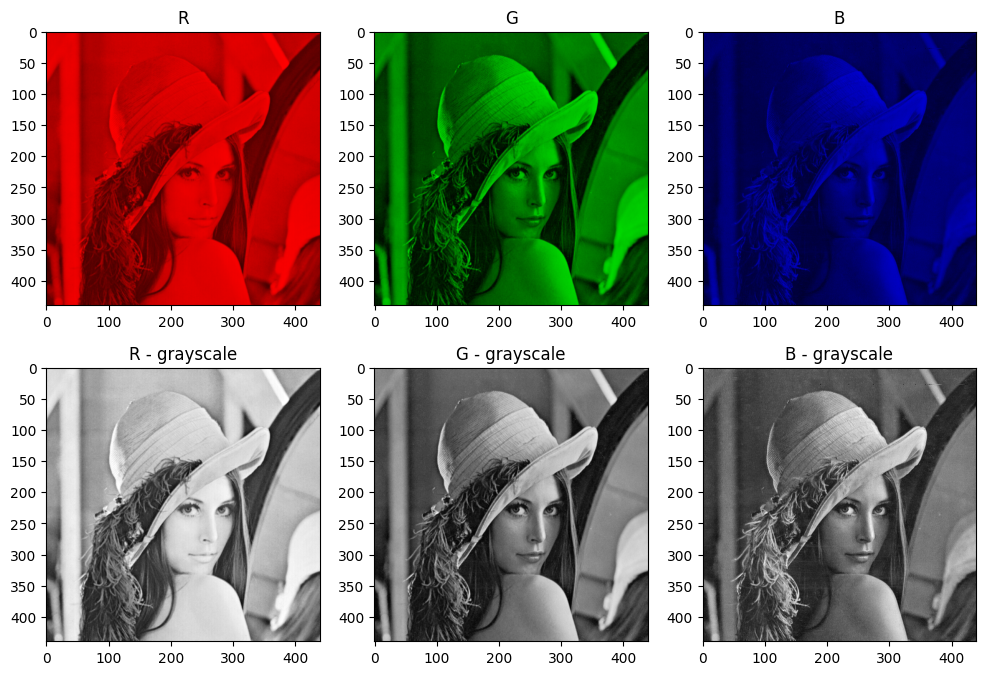

In [ ]:
fig = plt.figure(figsize=(12, 8))

title_list = ['R', 'G', 'B',
              'R - grayscale', 'G - grayscale', 'B - grayscale']
image_list = [image_red, image_green, image_blue,
              image_red[:, :, 0], image_green[:, :, 1], image_blue[:, :, 2]]

for i, image in enumerate(image_list):
  ax = fig.add_subplot(2, 3, i + 1)
  ax.title.set_text("{}".format(title_list[i]))

  if i >= 3:
    plt.imshow(image, cmap='gray')
  else:
    plt.imshow(image)

plt.show()

### 연산 과정

- 각 채널마다 컨볼루션 연산을 적용
  - 3채널을 모두 합쳐서 '하나의 필터'라고 칭함  
    
  <img src="https://miro.medium.com/max/2000/1*8dx6nxpUh2JqvYWPadTwMQ.gif" width="600">

<br>

- 각각의 결과를 더함  
  
  <img src="https://miro.medium.com/max/2000/1*CYB2dyR3EhFs1xNLK8ewiA.gif" width="600">

<br>

- 더한 결과에 편향을 더함  
  <img src="https://miro.medium.com/max/588/1*RYYucIh3U-YFxrIkyQKzRw.gif" width="300">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>



### modules import

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib
import requests
from io import BytesIO

### util functions

In [ ]:
def url_to_image(url, gray=False):
  resp = urllib.request.urlopen(url)
  image = np.asarray(bytearray(resp.read()), dtype="uint8")

  if gray == True:
    image = cv2.imdecode(image, cv2.IMREAD_GRAYSCALE)
  else:
    image = cv2.imdecode(image, cv2.IMREAD_COLOR)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

  return image

def conv_op(image, kernel, pad=0, stride=1):
  H, W, C = image.shape
  kernel_size = kernel.shape[0]

  out_h = (H + 2*pad - kernel_size) // stride + 1
  out_w = (W + 2*pad - kernel_size) // stride + 1

  filtered_img = np.zeros((out_h, out_w))
  img = np.pad(image, [(pad, pad), (pad,pad),(0, 0)], 'constant')

  for i in range(out_h):
    for j in range(out_w):
      for c in range(C):
        multiply_values = img[i: (i + kernel_size), j:(j + kernel_size), c] * kernel
        sum_value = np.sum(multiply_values)

        filtered_img[i, j] += sum_value

  filtered_img = filtered_img.reshape(1, out_h, out_w, -1).transpose(0, 3, 1, 2)

  return filtered_img.astype(np.uint8)


### 이미지 확인

image.shape: (440, 440, 3)


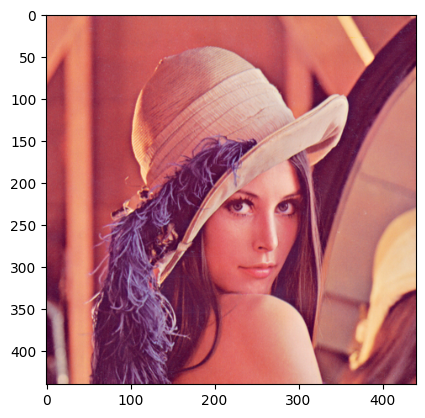

In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

image = url_to_image(img_url)
print("image.shape:", image.shape)

plt.imshow(image)
plt.show()

### 필터연산 적용
- 3x3 크기의 3채널 필터 5개

- (5, 3, 3, 3) ----> (5개, 3채널, 세로, 가로)

In [ ]:
filter1 = np.random.randn(3, 3, 3)

print(filter1.shape)
print(filter1)

(3, 3, 3)
[[[-0.74964264  0.3461021  -0.83358668]
  [ 0.08854595  0.3278614  -0.92091516]
  [-0.74967347 -1.73418473  1.24771433]]

 [[ 0.55633834 -1.61556645  0.02425987]
  [ 0.96684354  2.37583869 -1.07355541]
  [-0.59142946 -0.65872807 -2.01154283]]

 [[-1.3179575  -1.84234656  0.36197434]
  [ 0.04684848  0.02544209  0.30780639]
  [-0.38218456  1.2292017  -0.70421572]]]


(1, 1, 438, 438)


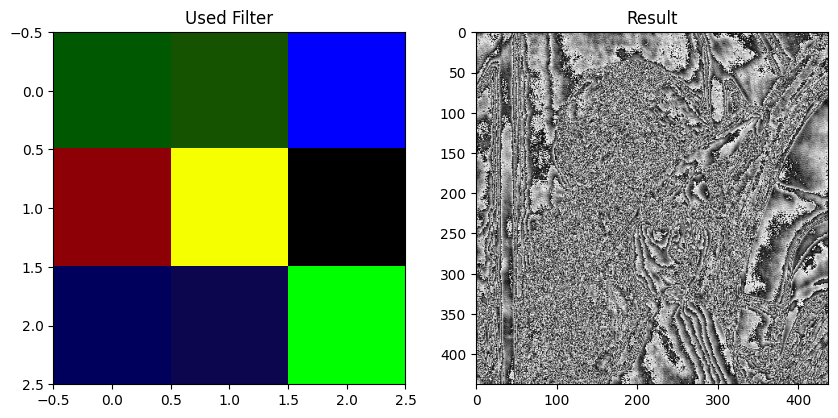

In [ ]:
filtered_img1 = conv_op(image, filter1)
print(filtered_img1.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter1, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img1[0, 0, :, :], cmap='gray')
plt.show()

In [ ]:
filter2 = np.random.randn(3, 3, 3)

print(filter2.shape)
print(filter2)

(3, 3, 3)
[[[ 0.70589845 -2.04715777 -0.38478926]
  [-2.53805432  0.26918225  1.05691127]
  [ 1.86704134 -2.11242422 -1.03945795]]

 [[-0.95971997  1.63679466  0.13384202]
  [ 2.09191302  0.33096787 -1.36726223]
  [-0.23288305 -0.65047576  0.08616772]]

 [[ 0.08950091 -0.3015733  -0.86961248]
  [-0.58983599  0.88343866  0.85061534]
  [ 1.78186107  0.37884992 -1.12394811]]]


(1, 1, 438, 438)


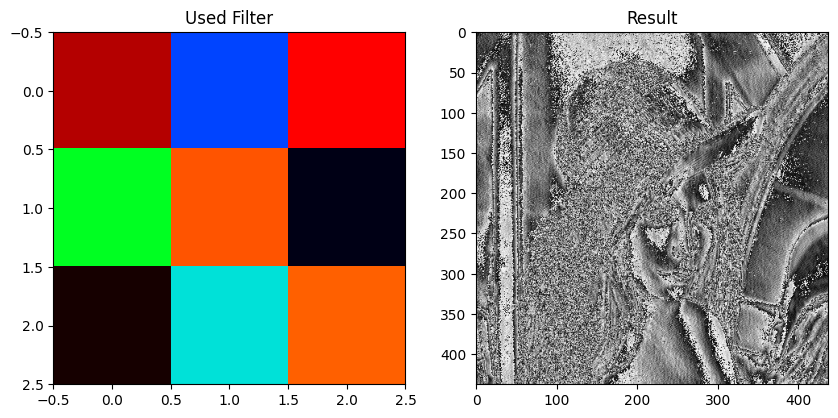

In [ ]:
filtered_img2 = conv_op(image, filter2)
print(filtered_img2.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter2, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img2[0, 0, :, :], cmap='gray')
plt.show()

In [ ]:
filter3 = np.random.randn(3, 3, 3)

print(filter3.shape)
print(filter3)

(3, 3, 3)
[[[ 0.8501811  -0.42970705  0.68014488]
  [-1.96238353 -0.08672376 -0.45664249]
  [ 0.87207368 -0.44396653  0.43155904]]

 [[ 0.09190325 -1.57042048 -0.956842  ]
  [-0.8962353  -0.20847777 -1.67158686]
  [ 0.07145418 -0.95720938  0.22119218]]

 [[-0.16380337 -0.68691739  0.21034229]
  [ 0.81612467  1.29327832 -2.78232728]
  [-1.1809326  -1.76157979 -0.32625806]]]


(1, 1, 438, 438)


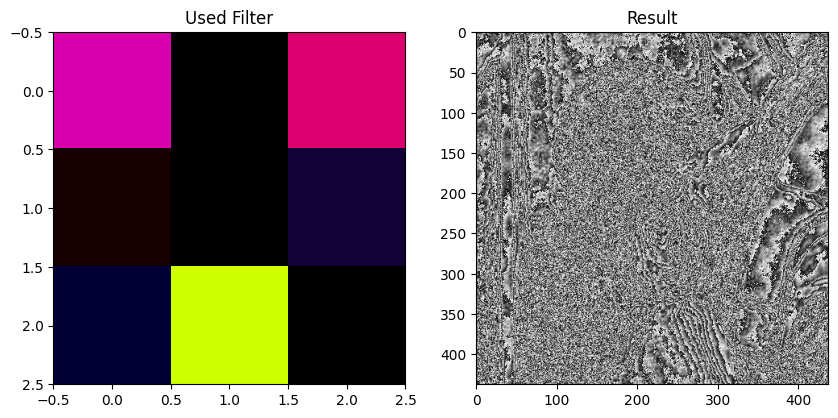

In [ ]:
filtered_img3 = conv_op(image, filter3)
print(filtered_img3.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter3, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img3[0, 0, :, :], cmap='gray')
plt.show()

In [ ]:
filter4 = np.random.randn(3, 3, 3)

print(filter4.shape)
print(filter4)

(3, 3, 3)
[[[ 1.17939383  0.98608821  0.46575622]
  [-0.84279602 -0.64374208  2.27340602]
  [ 1.44425269 -0.06821094  0.01653073]]

 [[-0.28949686  1.6667719  -1.16291924]
  [-0.51365656  0.23192178 -0.47191484]
  [ 1.04806909  2.96546626 -1.54589136]]

 [[ 0.49894573  1.3149993  -0.53092687]
  [ 0.01900418 -0.38736242 -0.07990076]
  [-1.04970968  0.54659344  0.57735472]]]


(1, 1, 438, 438)


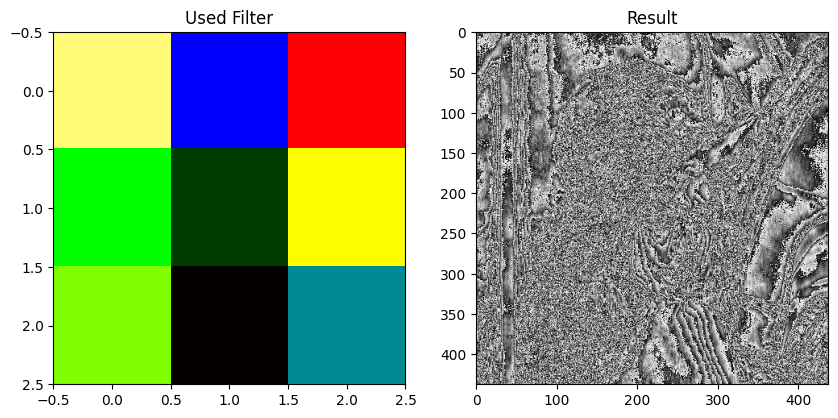

In [ ]:
filtered_img4 = conv_op(image, filter4)
print(filtered_img4.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter4, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img4[0, 0, :, :], cmap='gray')
plt.show()

In [ ]:
filter5 = np.random.randn(3, 3, 3)

print(filter5.shape)
print(filter5)

(3, 3, 3)
[[[-0.78980555  0.39666435  0.77422076]
  [ 0.03398446  0.34490367  0.69407729]
  [ 1.17116333  1.05038558 -1.74693318]]

 [[ 1.26794144  1.05621463 -0.27510704]
  [-0.2216294   0.7804792  -1.14944687]
  [ 1.13877882  0.25811823 -2.28342559]]

 [[-0.96779367 -0.51733443  0.28691128]
  [-0.50164502  0.59171478 -0.68915305]
  [-0.49535768  0.65508068 -0.22035028]]]


(1, 1, 438, 438)


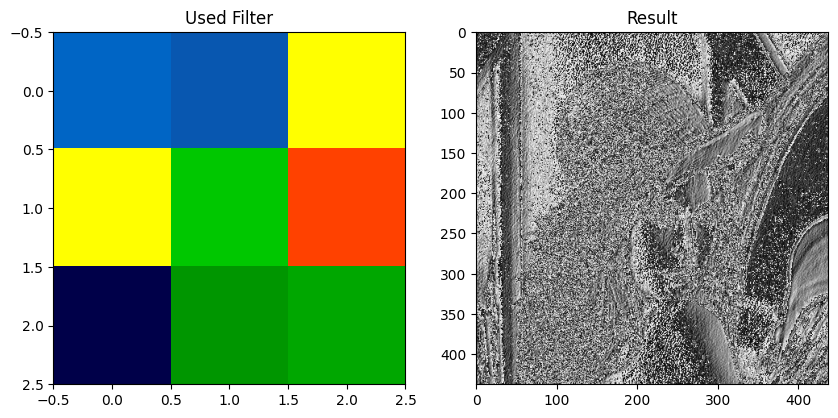

In [ ]:
filtered_img5 = conv_op(image, filter5)
print(filtered_img5.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title('Used Filter')
plt.imshow(filter5, cmap='gray')

plt.subplot(1, 2, 2)
plt.title('Result')
plt.imshow(filtered_img5[0, 0, :, :], cmap='gray')
plt.show()

### 필터연산을 적용한 최종 결과

(1, 1, 438, 438)


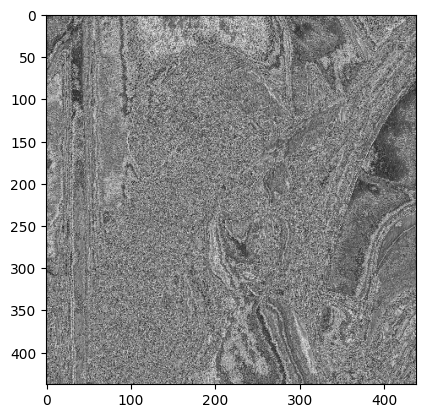

In [ ]:
filtered_img = np.stack([filtered_img1,filtered_img2,filtered_img3,filtered_img4,filtered_img5]).sum(axis=0)
print(filtered_img.shape)

plt.imshow(filtered_img[0, 0, :, :], cmap='gray')
plt.show()

### 전체 과정 한번에 보기

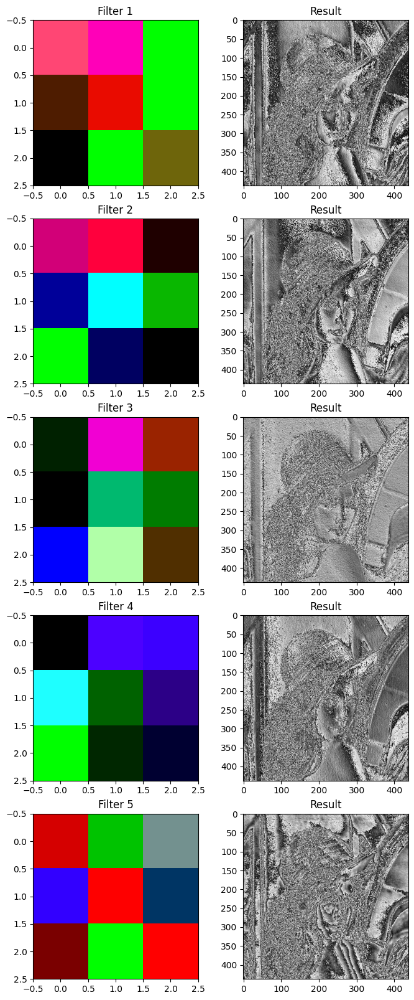

In [ ]:
np.random.seed(222)

fig = plt.figure(figsize=(8, 20))

filter_num = 5
filtered_img = []

for i in range(filter_num):
  ax = fig.add_subplot(5, 2, 2*i+1)
  ax.title.set_text("Filter {}".format(i+1))

  filter = np.random.randn(3, 3, 3)
  plt.imshow(filter);

  ax = fig.add_subplot(5, 2, 2*i+2)
  ax.title.set_text("Result")

  filtered = conv_op(image, filter)
  filtered_img.append(filtered)

  plt.imshow(filtered[0, 0, :, :], cmap='gray')

plt.show()

(1, 1, 438, 438)


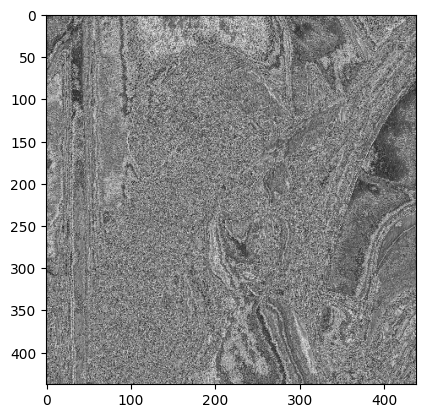

In [ ]:
filtered_img = np.stack([filtered_img1,filtered_img2,filtered_img3,filtered_img4,filtered_img5]).sum(axis=0)
print(filtered_img.shape)

plt.imshow(filtered_img[0, 0, :, :], cmap='gray')
plt.show()

# 합성곱 신경망 구현
- 참고: 밑바닥부터 시작하는 딥러닝1

## 합성곱 층(Convolution Layer)

In [ ]:
# im2col 함수: 입력 이미지를 2D 배열로 변환
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_data.shape
    out_h = (H + 2 * pad - filter_h) // stride + 1
    out_w = (W + 2 * pad - filter_w) // stride + 1

    img = np.pad(input_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], 'constant')
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N * out_h * out_w, -1)
    return col

# col2im 함수: 2D 배열을 다시 이미지로 변환
def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))
    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]

In [ ]:
# Conv2D 클래스: 합성곱 계층 정의
class Conv2D:
    def __init__(self, W, b, stride=1, pad=0):
        self.W = W
        self.b = b
        self.stride = stride
        self.pad = pad

        self.input_data = None
        self.col = None
        self.col_W = None

        self.dW = None
        self.db = None

    def forward(self, input_data):
        FN, C, FH, FW = self.W.shape
        N, C, H, W = input_data.shape
        out_h = (H + 2 * self.pad - FH) // self.stride + 1
        out_w = (W + 2 * self.pad - FW) // self.stride + 1

        col = im2col(input_data, FH, FW, self.stride, self.pad)
        col_W = self.W.reshape(FN, -1).T

        # 합성곱 연산
        out = np.dot(col, col_W) + self.b
        output = out.reshape(N, out_h, out_w, -1).transpose(0, 3, 1, 2)

        self.input_data = input_data
        self.col = col
        self.col_W = col_W

        return output

    def backward(self, dout):
      FN, C, FH, FW = self.W.shape
      dout = dout.transpose(0, 2, 3, 1).reshape(-1, FN)

      self.db = np.sum(dout, axis = 0)
      self.dW = np.dot(self.col.T, dout)
      self.dW = self.dW.transpose(1, 0).reshape(FN, C, FH, FW)

      dcol = np.dot(dout, self.col_W.T)
      dx = col2im(dcol, self.input_data.shape, FH, FW, self.stride, self.pad)

      return dx



### 컨볼루션 레이어 테스트

In [ ]:
# 가중치 및 편향 초기화 함수
def init_weight(num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):
    weights = weight_std * np.random.randn(num_filters, data_dim, kernel_size, kernel_size)
    biases = np.zeros(num_filters)
    return weights, biases

image_gray.shape: (1, 1, 440, 440)


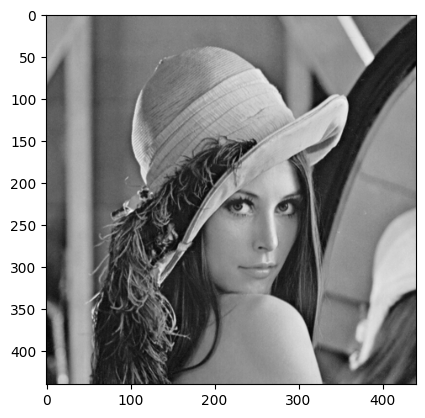

In [ ]:
# 이미지 불러오기 및 전처리
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_gray = url_to_image(img_url, gray=True)

# CNN 입력 형태로 변환 (N, C, H, W)
image_gray = image_gray.reshape(1, 1, image_gray.shape[0], image_gray.shape[1])
print("image_gray.shape:", image_gray.shape)  # 예상 출력: (1, 1, 440, 440)

# 이미지 시각화
plt.imshow(image_gray[0, 0], cmap='gray')  # 첫 번째 배치, 첫 번째 채널의 이미지 표시
plt.show()

In [ ]:
# Conv2D 테스트
W, b = init_weight(num_filters=1, data_dim=1, kernel_size=3)  # 1개의 3x3 필터
conv = Conv2D(W, b, stride=1, pad=0)
output = conv.forward(image_gray)

print("Conv Layer size:", output.shape)

Conv Layer size: (1, 1, 438, 438)


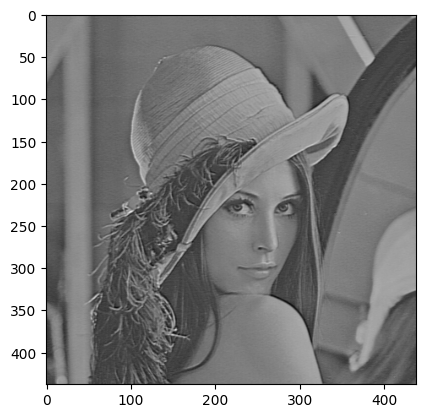

In [ ]:
plt.imshow(output[0, 0, :, :], cmap='gray')
plt.show()

In [ ]:
# Conv2D 테스트
W2, b2 = init_weight(num_filters=1, data_dim=1, kernel_size=3)  # 1개의 3x3 필터
conv2 = Conv2D(W2, b2, stride=2, pad=0)
output2 = conv2.forward(image_gray)

print("Conv Layer size:", output2.shape)

Conv Layer size: (1, 1, 219, 219)


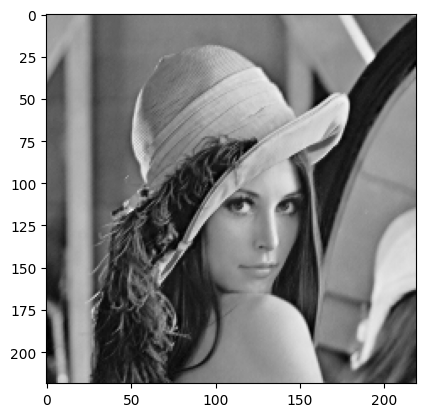

In [ ]:
plt.imshow(output2[0, 0, :, :], cmap='gray')
plt.show()

image.shape: (440, 440, 3)


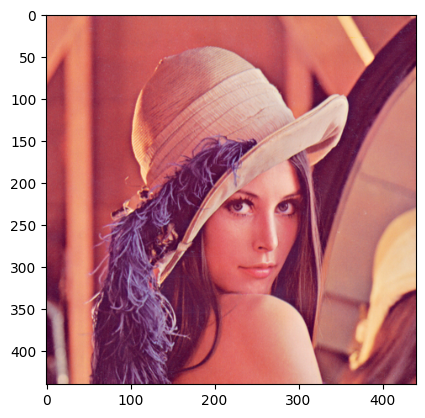

image_color.shape: (1, 3, 440, 440)


In [ ]:
# 이미지 불러오기 및 전처리
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_color = url_to_image(img_url)

# RGBA에서 RGB만 선택
image_color = image_color[:, :, :3]  # Alpha 채널 제거
print("image.shape:", image_color.shape)  # (440, 440, 3)

plt.imshow(image_color)
plt.show()

# CNN 입력 형태로 변환 (N, C, H, W)
image_color = np.expand_dims(image_color.transpose(2, 0, 1), axis=0)
print("image_color.shape:", image_color.shape)  # (1, 3, 440, 440)

In [ ]:
# Conv2D 테스트
W3, b3 = init_weight(num_filters=10, data_dim=3, kernel_size=3)  # 1개의 3x3 필터
conv3 = Conv2D(W3, b3, stride=1, pad=0)
output3 = conv3.forward(image_color)

print("Conv Layer size:", output3.shape)

Conv Layer size: (1, 10, 438, 438)


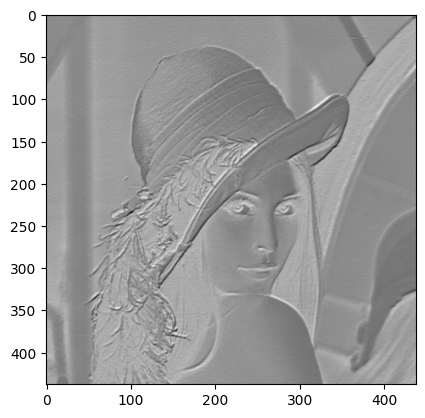

In [ ]:
plt.imshow(output3[0, 3, :, :], cmap='gray')
plt.show()

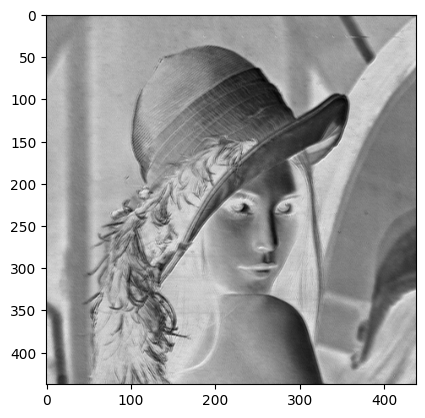

In [ ]:
plt.imshow(output3[0, 8, :, :], cmap='gray')
plt.show()

### 동일한 이미지 여러 장 테스트 (배치 처리)

Original shape: (440, 440)
Final shape: (1, 1, 440, 440)


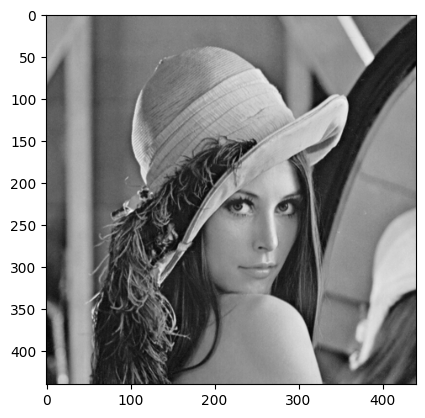

In [ ]:
# 이미지 불러오기 및 전처리
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_gray = url_to_image(img_url, gray=True)
print("Original shape:", image_gray.shape)  # (440, 440)

# 먼저 채널 차원 추가 (H, W) -> (C, H, W)
image_gray = np.expand_dims(image_gray, axis=0)  # (1, 440, 440)

# 배치 차원 추가 (C, H, W) -> (N, C, H, W)
image_gray = np.expand_dims(image_gray, axis=0)  # (1, 1, 440, 440)
print("Final shape:", image_gray.shape)  # (1, 1, 440, 440)

# 이미지 시각화
plt.imshow(image_gray[0, 0], cmap='gray')  # 첫 번째 배치, 첫 번째 채널의 이미지 표시
plt.show()

In [ ]:
# 배치 생성 (15개의 동일한 이미지)
batch_image_gray = np.repeat(image_gray, 15, axis=0)  # np.newaxis 제거
print("Batch shape:", batch_image_gray.shape)  # (15, 1, 440, 440)

Batch shape: (15, 1, 440, 440)


In [ ]:
# Conv2D 테스트
W4, b4 = init_weight(num_filters=10, data_dim=1, kernel_size=3)
conv4 = Conv2D(W4, b4, stride=1, pad=0)
output4 = conv4.forward(batch_image_gray)

print("Conv Layer size:", output4.shape)  # (15, 10, 219, 219)

Conv Layer size: (15, 10, 438, 438)


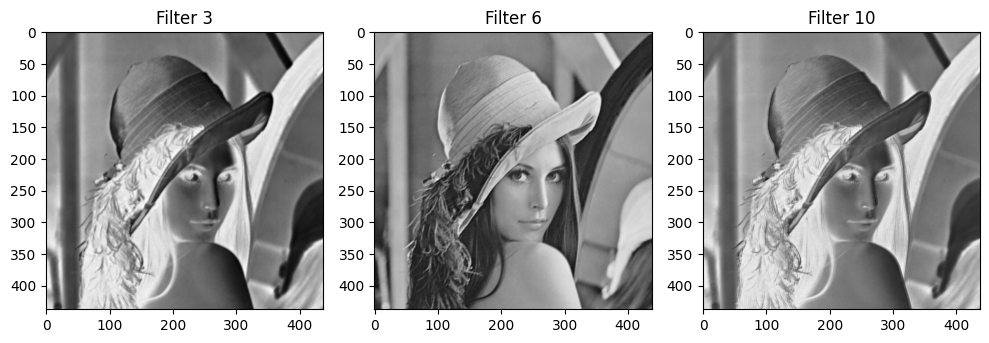

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 3")
plt.imshow(output4[3, 2, :, :], cmap='gray')  # 필터 3 (인덱스 2)

plt.subplot(1, 3, 2)
plt.title("Filter 6")
plt.imshow(output4[3, 5, :, :], cmap='gray')  # 필터 6 (인덱스 5)로 수정

plt.subplot(1, 3, 3)
plt.title("Filter 10")
plt.imshow(output4[3, 9, :, :], cmap='gray')  # 필터 10 (인덱스 9)

plt.tight_layout()
plt.show()

In [ ]:
# Conv2D 테스트
W5, b5 = init_weight(num_filters=32, data_dim=3, kernel_size=3)
conv5 = Conv2D(W5, b5, stride=3, pad=0)
output5 = conv5.forward(image_color)

print("Conv Layer size:", output5.shape)  # (15, 10, 219, 219)

Conv Layer size: (1, 32, 146, 146)


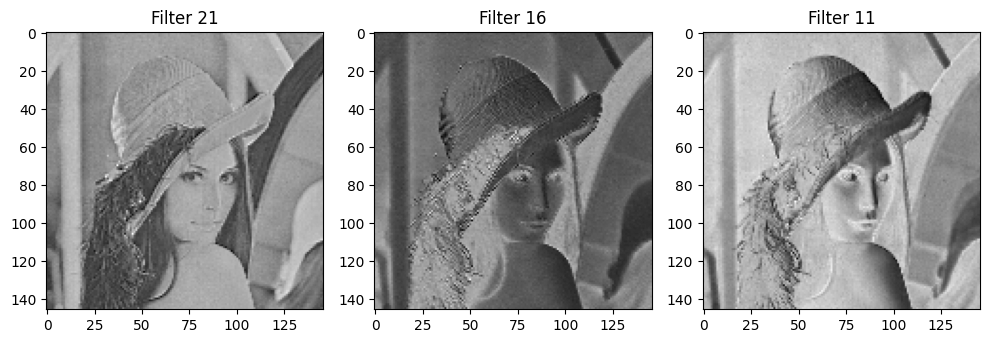

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 21")
plt.imshow(output5[0, 20, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Filter 16")
plt.imshow(output5[0, 14, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Filter 11")
plt.imshow(output5[0, 10, :, :], cmap='gray')

plt.tight_layout()
plt.show()

### 동일한 이미지 배치처리(color)

In [ ]:
# 이미지 불러오기 및 전처리
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_color = url_to_image(img_url)[:, :, :3]  # Alpha 채널 제거
print("Original shape:", image_color.shape)  # (440, 440, 3)

# (H, W, C) -> (C, H, W) 변환
image_color = image_color.transpose(2, 0, 1)
print("After transpose:", image_color.shape)  # (3, 440, 440)

# 배치 차원 추가 (C, H, W) -> (N, C, H, W)
image_color = np.expand_dims(image_color, axis=0)  # (1, 3, 440, 440)
print("After adding batch dim:", image_color.shape)

Original shape: (440, 440, 3)
After transpose: (3, 440, 440)
After adding batch dim: (1, 3, 440, 440)


In [ ]:
# 배치 생성
batch_image_color = np.repeat(image_color, 15, axis=0)  # np.newaxis 제거
print("Batch shape:", batch_image_color.shape)  # (15, 3, 440, 440)

Batch shape: (15, 3, 440, 440)


In [ ]:
# Conv2D 테스트
W6, b6 = init_weight(num_filters=64, data_dim=3, kernel_size=5)
conv6 = Conv2D(W6, b6, stride=1, pad=0)
output6 = conv6.forward(batch_image_color)

print("Conv Layer size:", output6.shape)  # (15, 64, 436, 436)

Conv Layer size: (15, 64, 436, 436)


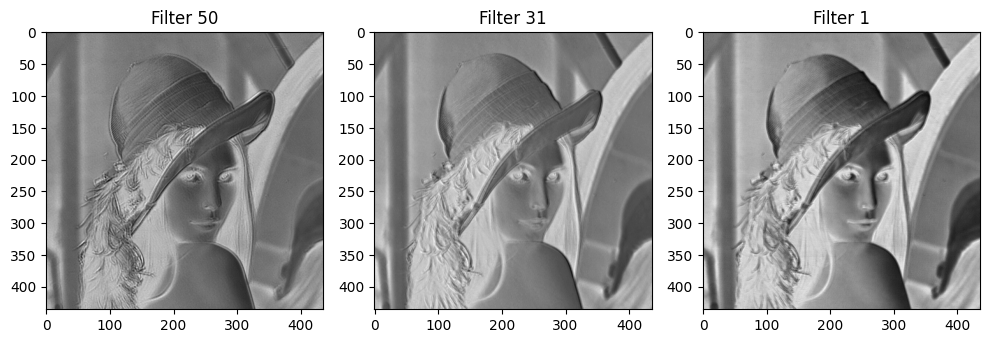

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 50")
plt.imshow(output6[0, 49, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Filter 31")
plt.imshow(output6[0, 30, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Filter 1")
plt.imshow(output6[10, 0, :, :], cmap='gray')

plt.tight_layout()
plt.show()

## 풀링 층(Pooling Layer)

In [ ]:
class Pooling2D:

  def __init__(self, kernel_size=2, stride=1, pad=0):
    self.kernel_size = kernel_size
    self.stride = stride
    self.pad = pad

    self.input_data =None
    self.arg_max = None

  def forward(self, input_data):
    N, C, H, W = input_data.shape
    out_h = (H - self.kernel_size) // self.stride + 1
    out_w = (W - self.kernel_size) // self.stride + 1

    col = im2col(input_data, self.kernel_size, self.kernel_size, self.stride, self.pad)
    col = col.reshape(-1, self.kernel_size * self.kernel_size)

    arg_max = np.argmax(col, axis=1)
    out = np.max(col, axis=1)
    output = out.reshape(N, out_h, out_w, C).transpose(0, 3, 1, 2)

    self.input_data = input_data
    self.arg_max = arg_max

    return output

  def backward(self, dout):
    dout = dout.transpose(0, 2, 3, 1)

    pool_size = self.kernel_size * self.kernel_size
    dmax = np.zeros((dout.size, pool_size))
    dmax[np.arange(self.arg_max.size), self.arg_max.flatten()] = dout.flatten()
    dmax = dmax.reshape(dout.shape + (pool_size,))

    dcol = dmax.reshape(dmax.shape[0] * dmax.shape[1] * dmax.shape[2], -1)
    dx = col2im(dcol, self.input_data.shape, self.kernel_size, self.kernel_size, self.stride, self.pad)

    return dx


### 풀링 레이어 테스트
- 2차원 이미지
  - (Height, Width, 1)

Original shape: (440, 440)
Final shape: (1, 1, 440, 440)


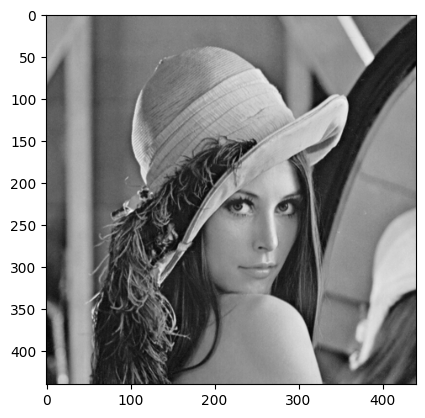

In [ ]:
# 이미지 불러오기 및 전처리
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_gray = url_to_image(img_url, gray=True)
print("Original shape:", image_gray.shape)  # (440, 440)

# 먼저 채널 차원 추가 (H, W) -> (C, H, W)
image_gray = np.expand_dims(image_gray, axis=0)  # (1, 440, 440)

# 배치 차원 추가 (C, H, W) -> (N, C, H, W)
image_gray = np.expand_dims(image_gray, axis=0)  # (1, 1, 440, 440)
print("Final shape:", image_gray.shape)  # (1, 1, 440, 440)

# 이미지 시각화
plt.imshow(image_gray[0, 0], cmap='gray')  # 첫 번째 배치, 첫 번째 채널의 이미지 표시
plt.show()

In [ ]:
W, b = init_weight(num_filters=8, data_dim=1, kernel_size=3)
conv = Conv2D(W, b, stride=1, pad=0)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output1 = conv.forward(image_gray)
print("Conv size:", output1.shape)

Conv size: (1, 8, 438, 438)


In [ ]:
output1 = pool.forward(output1)
print("Pooling Layer size", output1.shape)

Pooling Layer size (1, 8, 219, 219)


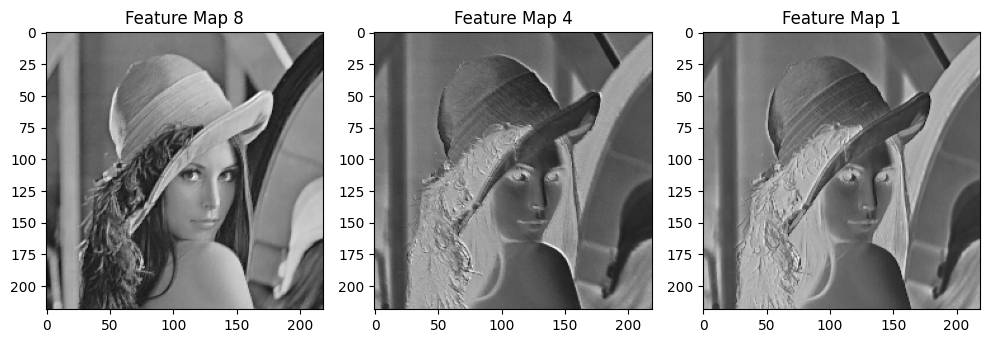

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 8")
plt.imshow(output1[0, 7, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 4")
plt.imshow(output1[0, 3, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 1")
plt.imshow(output1[0, 0, :, :], cmap='gray')

plt.tight_layout()
plt.show()

In [ ]:
W2, b2 = init_weight(num_filters=32, data_dim=1, kernel_size=3)
conv2 = Conv2D(W2, b2, stride=1, pad=0)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output2 = conv2.forward(image_gray)
output2 = pool.forward(output2)
print(output2.shape)

(1, 32, 219, 219)


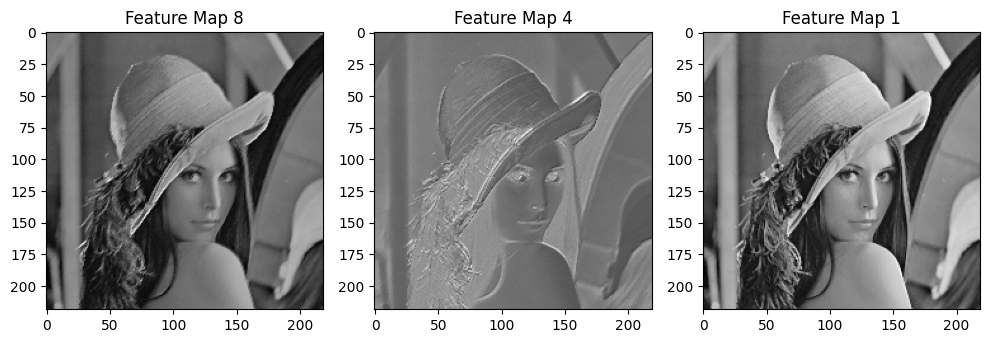

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 8")
plt.imshow(output2[0, 7, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 4")
plt.imshow(output2[0, 3, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 1")
plt.imshow(output2[0, 0, :, :], cmap='gray')

plt.tight_layout()
plt.show()

### 동일한 이미지 배치처리
- Color Image

- conv --> maxpooling --> conv --> maxpooling

- 시각화 과정
  - 5번째 이미지
  - [2, 5, 9] 필터를 통해 확인

Original shape: (440, 440, 3)


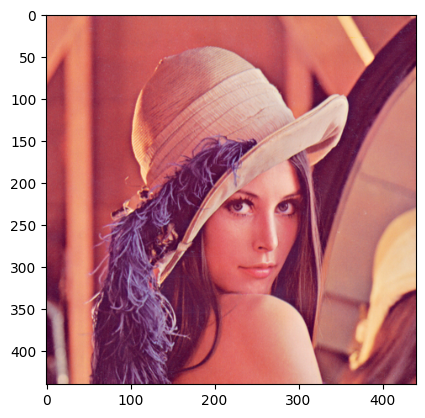

After transpose: (3, 440, 440)
After adding batch dim: (1, 3, 440, 440)


In [ ]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
image_color = url_to_image(img_url)[:, :, :3]
print("Original shape:", image_color.shape)

plt.imshow(image_color)
plt.show()

image_color = image_color.transpose(2, 0, 1)
print("After transpose:", image_color.shape)

image_color = np.expand_dims(image_color, axis=0)
print("After adding batch dim:", image_color.shape)


In [ ]:
batch_image_color = np.repeat(image_color, 15, axis=0)
print("Batch shape:", batch_image_color.shape)  # (15, 3, 440, 440)

Batch shape: (15, 3, 440, 440)


In [ ]:
W, b = init_weight(num_filters=10, data_dim=3, kernel_size=3)
conv1 = Conv2D(W, b, stride=1, pad=0)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output1 = conv1.forward(batch_image_color)
print(output1.shape)

(15, 10, 438, 438)


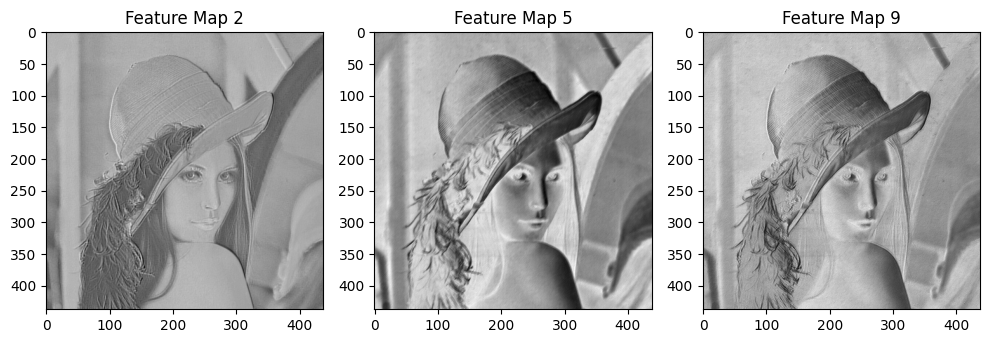

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output1[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output1[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output1[4, 8, :, :], cmap='gray')

plt.tight_layout()
plt.show()

In [ ]:
output1 = pool.forward(output1)
print(output1.shape)

(15, 10, 219, 219)


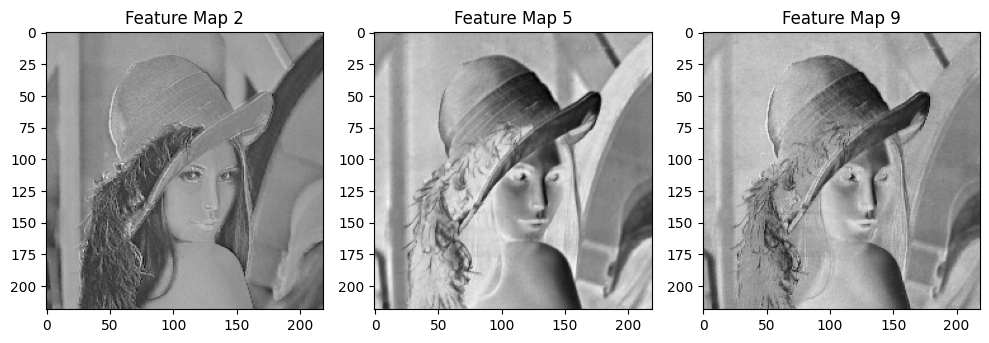

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output1[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output1[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output1[4, 8, :, :], cmap='gray')

plt.tight_layout()
plt.show()

In [ ]:
W2, b2 = init_weight(num_filters=30, data_dim=10, kernel_size=3)
conv2 = Conv2D(W2, b2, stride=1, pad=0)
pool = Pooling2D(stride=2, kernel_size=2)

In [ ]:
output2 = conv2.forward(output1)
print(output2.shape)

(15, 30, 217, 217)


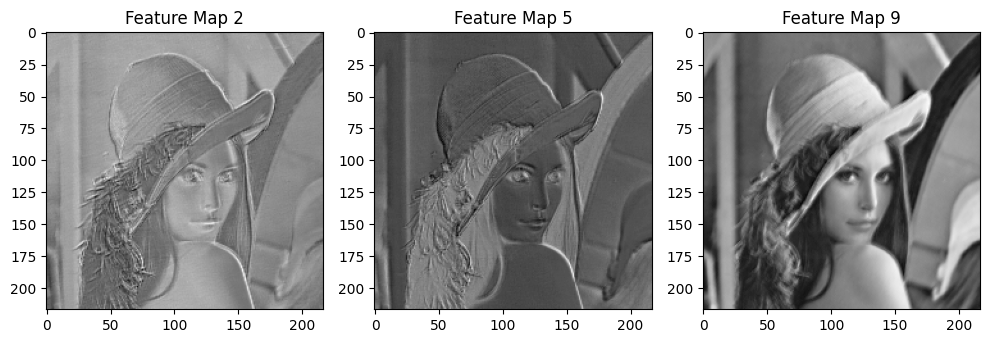

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output2[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output2[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output2[4, 8, :, :], cmap='gray')

plt.tight_layout()
plt.show()

In [ ]:
output2 = pool.forward(output2)
print(output2.shape)

(15, 30, 108, 108)


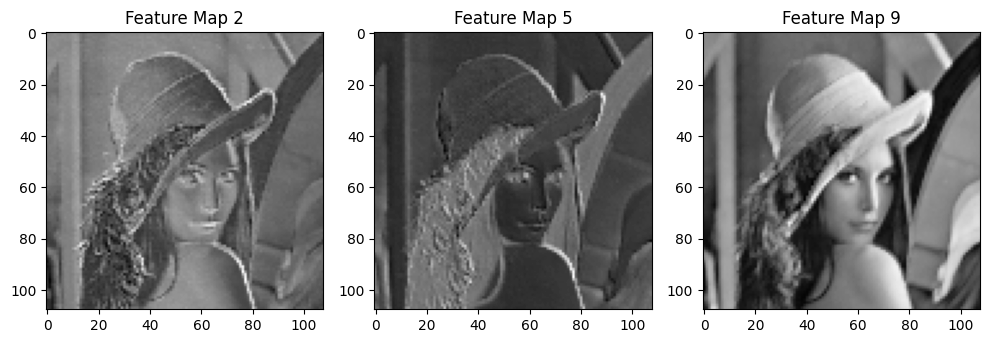

In [ ]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output2[4, 1, :, :], cmap='gray')

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output2[4, 4, :, :], cmap='gray')

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output2[4, 8, :, :], cmap='gray')

plt.tight_layout()
plt.show()

# 대표적인 CNN 모델 소개

## LeNet - 5

<img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>

## AlexNet

- 활성화 함수로 **ReLU** 사용

- 국소적 정규화(Local Response normalization, LRN) 실시하는 계층 사용

- 드롭아웃

  <img src="https://miro.medium.com/proxy/1*qyc21qM0oxWEuRaj-XJKcw.png" width="800">

  <center>[AlexNet 구조]</center>

  <sub>출처: http://www.cs.toronto.edu/~hinton/absps/imagenet.pdf</sub>

## VGG - 16

- 모든 컨볼루션 레이어에서의 필터(커널) 사이즈를 **3x3**으로 설정

- 2x2 MaxPooling

- 필터의 개수는 Conv Block을 지나가면서 2배씩 증가  
  32 -> 64 -> 128

  <br>

  <img src="https://www.researchgate.net/profile/Jose_Cano31/publication/327070011/figure/fig1/AS:660549306159105@1534498635256/VGG-16-neural-network-architecture.png" width="800">

  <center>[VGG-16 구조]</center>

  <sub>출처: Very Deep Convolutional Networks for Large-Scale Image Recognition</sub>

# CNN 학습 구현 - MNIST

## modules import

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

## Util Functions

In [ ]:
# im2col 함수: 입력 이미지를 2D 배열로 변환
def im2col(input_data, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_data.shape
    out_h = (H + 2 * pad - filter_h) // stride + 1
    out_w = (W + 2 * pad - filter_w) // stride + 1

    img = np.pad(input_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], 'constant')
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]

    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N * out_h * out_w, -1)
    return col

# col2im 함수: 2D 배열을 다시 이미지로 변환
def col2im(col, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h)//stride + 1
    out_w = (W + 2*pad - filter_w)//stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2*pad + stride - 1, W + 2*pad + stride - 1))
    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]
def softmax(x):
    if x.ndim == 2:
      x =x.T
      x = x - np.max(x, axis=0)
      y = np.exp(x) / np.sum(np.exp(x), axis=0)
      return y.T

    x = x - np.max(x)
    return np.exp(x) / np.sum(np.exp(x))

def mean_squared_error(pred_y, true_y):
  return 0.5 * np.sum((pred_y - true_y)**2)

def cross_entropy_error(pred_y, true_y):
  if pred_y.ndim == 1:
    true_y = true_y.reshape(1, true_y.size)
    pred_y = pred_y.reshape(1, pred_y.size)

  if true_y.size == pred_y.size:
    true_y = true_y.argmax(axis=1)

  batch_size = pred_y.shape[0]
  return -np.sum(np.log(pred_y[np.arange(batch_size), true_y] + 1e-7)) / batch_size

def softmax_loss(X, true_y):
  pred_y = softmax(X)
  return cross_entropy_error(pred_y, true_y)


## Util Classes

In [ ]:
class ReLU:
  def __init__(self):
    self.mask = None

  def forward(self, x):
    self.mask = (x <= 0)
    out = x.copy()
    out[self.mask] = 0

    return out

  def backward(self, dout):
    dout[self.mask] = 0
    dx = dout

    return dx

class Sigmoid:
  def __init__(self):
    self.out = None

  def forward(self, x):
    out = Sigmoid(x)
    self.out = out
    return out

  def backward(self, dout):
    dx = dout * (1.0 - self.out) * self.out

    return dx

class Layer:
  def __init__(self, W, b):
    self.W = W
    self.b = b

    self.input_data = None
    self.input_data_shape = None

    self.dW = None
    self.db = None

  def forward(self, input_data):
    self.input_data_shape = input_data.shape
    input_data = input_data.reshape(input_data.shape[0], -1)
    self.input_data = input_data

    out = np.dot(self.input_data, self.W) + self.b

    return out

  def backward(self, dout):
    dx = np.dot(dout, self.W.T)
    self.dW = np.dot(self.input_data.T, dout)
    self.db = np.sum(dout, axis = 0)

    dx = dx.reshape(*self.input_data_shape)
    return dx


class Softmax:

  def __init__(self):
    self.loss = None
    self.y = None
    self.t = None

  def forward(self, x, t):
    self.t = t
    self.y = softmax(x)
    self.loss = cross_entropy_error(self.y, self.t)

    return self.loss

  def backward(self, dout=1):
    batch_size = self.t.shape[0]
    if self.t.size == self.y.size:
      dx = (self.y - self.t) / batch_size
    else:
      dx = self.y.copy()
      dx[np.arange(batch_size), self.t] -= 1
      dx = dx / batch_size

    return dx


In [ ]:
class SGD:
  def __init__(self, learning_rate=0.01):
    self.learning_rate = learning_rate

  def update(self, params, grads):
    for key in params.keys():
      params[key] -= self.learning_rate * grads[key]

## 데이터 로드

In [ ]:
import tensorflow as tf
import numpy as np

np.random.seed(42)

mnist = tf.keras.datasets.mnist
(x_train, t_train), (x_test, t_test) = mnist.load_data()
num_classes = 10

11490434/11490434 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
print(x_train.shape)
print(t_train.shape)
print(x_test.shape)
print(t_test.shape)

(60000, 28, 28)
(60000,)
(10000, 28, 28)
(10000,)


In [ ]:
x_train, x_test = np.expand_dims(x_train, axis =1), np.expand_dims(x_test, axis=1)

In [ ]:
print(x_train.shape)
print(t_train.shape)
print(x_test.shape)
print(t_test.shape)

(60000, 1, 28, 28)
(60000,)
(10000, 1, 28, 28)
(10000,)


In [ ]:
x_train = x_train[:3000]
x_test = x_test[:500]
t_train = t_train[:3000]
t_test = t_test[:500]

print(x_train.shape)
print(t_train.shape)

print(x_test.shape)
print(t_test.shape)

(3000, 1, 28, 28)
(3000,)
(500, 1, 28, 28)
(500,)


## Build Model

In [ ]:
from collections import OrderedDict
import numpy as np

class MyModel:
   def __init__(self, input_dim=(1, 28, 28), num_outputs=10):
       conv1_block = {'num_filters':30,
                     'kernel_size':3,
                     'stride': 1,
                     'pad': 0}

       input_size = input_dim[1]
       conv_output_size = ((input_size - conv1_block['kernel_size'] + 2*conv1_block['pad']) // conv1_block['stride']) + 1
       pool_output_size = int(conv1_block['num_filters'] * (conv_output_size/2) * (conv_output_size/2))

       self.params = {}
       self.params['W1'], self.params['b1'] = self.__init_weight_conv(conv1_block['num_filters'], input_dim[0], 3)
       self.params['W2'], self.params['b2'] = self.__init_weight_fc(pool_output_size, 256)
       self.params['W3'], self.params['b3'] = self.__init_weight_fc(256, 10)

       self.layers = OrderedDict()
       self.layers['Conv1'] = Conv2D(self.params['W1'], self.params['b1'])
       self.layers['ReLU1'] = ReLU()
       self.layers['Pool1'] = Pooling2D(kernel_size=2, stride=2)
       self.layers['FC1'] = Layer(self.params['W2'], self.params['b2'])
       self.layers['ReLU2'] = ReLU()
       self.layers['FC2'] = Layer(self.params['W3'], self.params['b3'])
       self.last_layer = Softmax()

   def __init_weight_conv(self, num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):
       weights = weight_std * np.random.randn(num_filters, data_dim, kernel_size, kernel_size)
       biases = np.zeros(num_filters)
       return weights, biases

   def __init_weight_fc(self, num_inputs, num_outputs, weight_std=0.01):
       weights = weight_std * np.random.randn(num_inputs, num_outputs)
       biases = np.zeros(num_outputs)
       return weights, biases

   def forward(self, x):
       if x.ndim == 5:
        x = x.reshape(x.shape[0], x.shape[2], x.shape[3], x.shape[4])

       for layer in self.layers.values():
           x = layer.forward(x)

       return x

   def loss(self, x, true_y):
       pred_y = self.forward(x)
       return self.last_layer.forward(pred_y, true_y)

   def accuracy(self, x, true_y, batch_size=100):
       if true_y.ndim != 1:
           true_y = np.argmax(true_y, axis=1)

       accuracy = 0.0
       for i in range(int(x.shape[0] / batch_size)):
           tx = x[i*batch_size:(i+1)*batch_size]
           tt = true_y[i*batch_size:(i+1)*batch_size]
           y = self.forward(tx)
           y = np.argmax(y, axis=1)
           accuracy += np.sum(y == tt)

       return accuracy / x.shape[0]

   def gradient(self, x, true_y):
       self.loss(x, true_y)

       dout = 1
       dout = self.last_layer.backward(dout)

       layers = list(self.layers.values())
       layers.reverse()
       for layer in layers:
           dout = layer.backward(dout)

       grads = {}
       grads['W1'], grads['b1'] = self.layers['Conv1'].dW, self.layers['Conv1'].db
       grads['W2'], grads['b2'] = self.layers['FC1'].dW, self.layers['FC1'].db
       grads['W3'], grads['b3'] = self.layers['FC2'].dW, self.layers['FC2'].db

       return grads

## Hyper Parameters

In [ ]:
epochs = 10
train_size = x_train.shape[0]
batch_size = 200
learning_rate = 0.001
current_iter = 0

iter_per_epoch = max(train_size // batch_size, 1)

In [ ]:
train_loss_list = []
train_acc_list = []
test_acc_list = []

## 모델 생성 및 학습

In [ ]:
model = MyModel()
model.params.keys()

dict_keys(['W1', 'b1', 'W2', 'b2', 'W3', 'b3'])

In [ ]:
optimizer = SGD(learning_rate)

In [ ]:
for epoch in range(epochs):
    for i in range(iter_per_epoch):
        batch_mask = np.random.choice(train_size, batch_size)
        x_batch = x_train[batch_mask]
        t_batch = t_train[batch_mask]

        grads = model.gradient(x_batch, t_batch)
        optimizer.update(model.params, grads)

        loss = model.loss(x_batch, t_batch)
        train_loss_list.append(loss)

        x_train_sample, t_train_sample = x_train, t_train
        x_test_sample, t_test_sample = x_test, t_test

        train_acc = model.accuracy(x_train_sample, t_train_sample)
        test_acc = model.accuracy(x_test_sample, t_test_sample)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)

        current_iter += 1

    print(f"Epoch: {epoch + 1} Train Loss: {loss:.4f} Train Accuracy: {train_acc:.4f} Test Accuracy: {test_acc:.4f}")

Epoch: 1 Train Loss: 2.0989 Train Accuracy: 0.4087 Test Accuracy: 0.3840
Epoch: 2 Train Loss: 1.6469 Train Accuracy: 0.6493 Test Accuracy: 0.5960
Epoch: 3 Train Loss: 0.9295 Train Accuracy: 0.7923 Test Accuracy: 0.7600
Epoch: 4 Train Loss: 0.5803 Train Accuracy: 0.8410 Test Accuracy: 0.7780
Epoch: 5 Train Loss: 0.4640 Train Accuracy: 0.8650 Test Accuracy: 0.8160
Epoch: 6 Train Loss: 0.4874 Train Accuracy: 0.8737 Test Accuracy: 0.8380
Epoch: 7 Train Loss: 0.3654 Train Accuracy: 0.8943 Test Accuracy: 0.8520
Epoch: 8 Train Loss: 0.3333 Train Accuracy: 0.8890 Test Accuracy: 0.8460
Epoch: 9 Train Loss: 0.3822 Train Accuracy: 0.9083 Test Accuracy: 0.8680
Epoch: 10 Train Loss: 0.2589 Train Accuracy: 0.9057 Test Accuracy: 0.8660


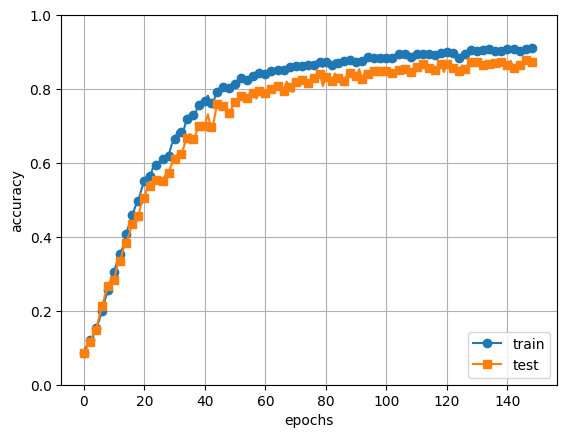

In [88]:
x = np.arange(current_iter)
plt.plot(x, train_acc_list, marker='o', label ='train', markevery=2)
plt.plot(x, test_acc_list, marker='s', label='test', markevery=2)
plt.grid()
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.ylim(0, 1.0)
plt.legend(loc='lower right')
plt.show()

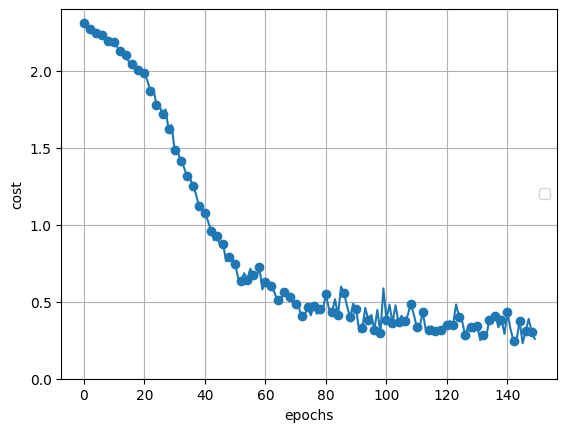

In [90]:
x = np.arange(current_iter)
plt.plot(x, train_loss_list, marker='o', markevery=2)
plt.grid()
plt.xlabel('epochs')
plt.ylabel('cost')
plt.ylim(0, 2.4)
plt.legend(loc='right')
plt.show()

### 생각보다 학습이 잘 되지 않았던 이유
- 학습 데이터의 수 부족
  - 학습 시간고려

- FC Layer의 노드수가 적절했는지

- 학습률(learning rate)값이 적절했는지

- ...

## 어떠한 조건에서 가장 좋은 결과를 내는지는 값을 **적절히** 바꾸어 시도해보아야함